### **Data/Image Preprocessing**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/ipvc/assignment1/dataset ./

Mounted at /content/drive


In [2]:
import cv2
import matplotlib.pyplot as plt

In [3]:
scenes = ['dataset/scenes/scene6.png',
          'dataset/scenes/scene7.png', 'dataset/scenes/scene8.png',
          'dataset/scenes/scene9.png', 'dataset/scenes/scene10.png',
          'dataset/scenes/scene11.png', 'dataset/scenes/scene12.png']

save succeded as: dataset/scenes/scene6_filtered.png


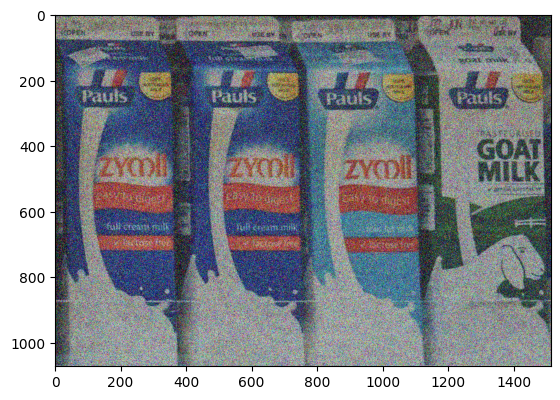

save succeded as: dataset/scenes/scene7_filtered.png


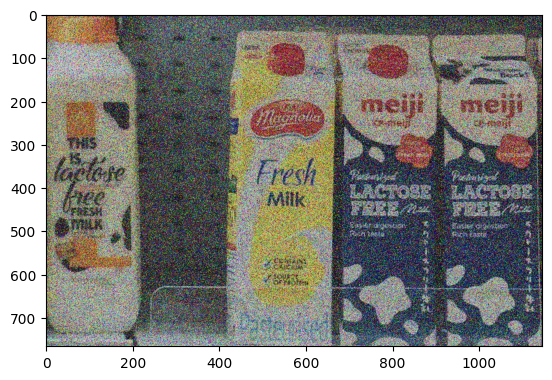

save succeded as: dataset/scenes/scene8_filtered.png


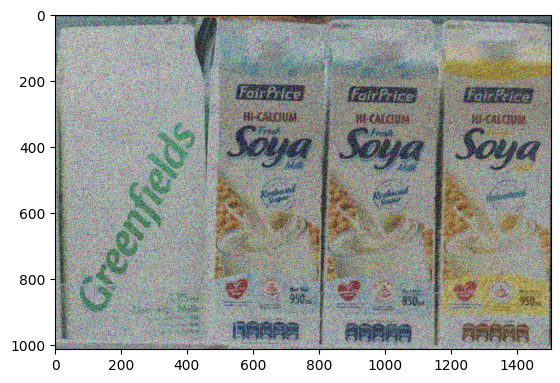

save succeded as: dataset/scenes/scene9_filtered.png


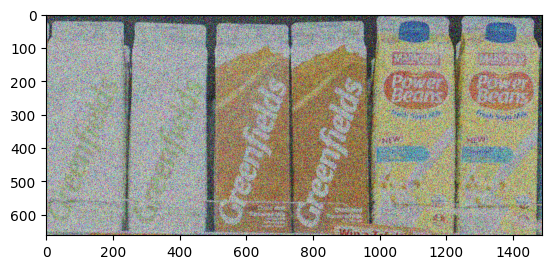

save succeded as: dataset/scenes/scene10_filtered.png


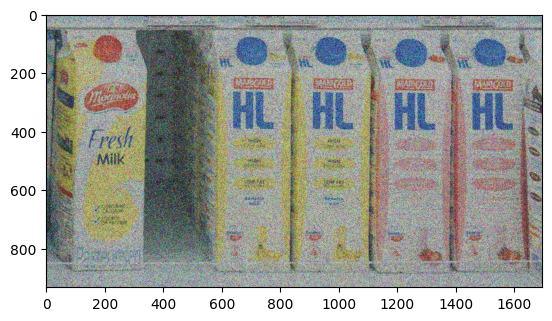

save succeded as: dataset/scenes/scene11_filtered.png


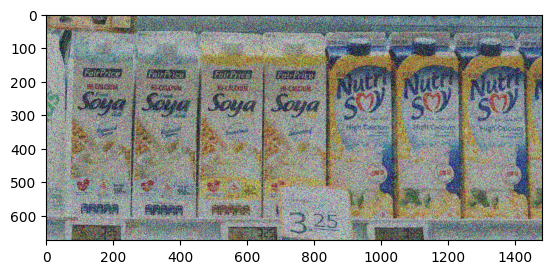

save succeded as: dataset/scenes/scene12_filtered.png


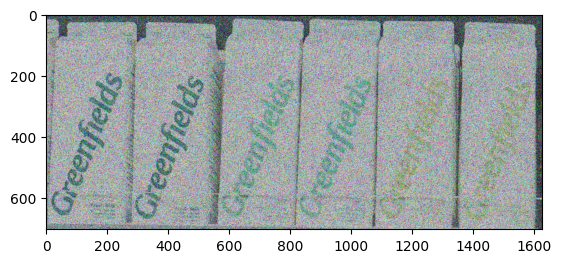

In [4]:
for scene in scenes:
  img = cv2.imread(scene)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  denoised_img = cv2.bilateralFilter(img_rgb, 25, 50, 100)
  name = scene.replace(".png", "_filtered.png")
  cv2.imwrite(name, cv2.cvtColor(denoised_img, cv2.COLOR_RGB2BGR))
  print(f"save succeded as: {name}")
  plt.imshow(denoised_img)
  plt.show()

### **Trial on One Instance and One Scene Image**

**Using SIFT and FLANN (just like the lab session)**

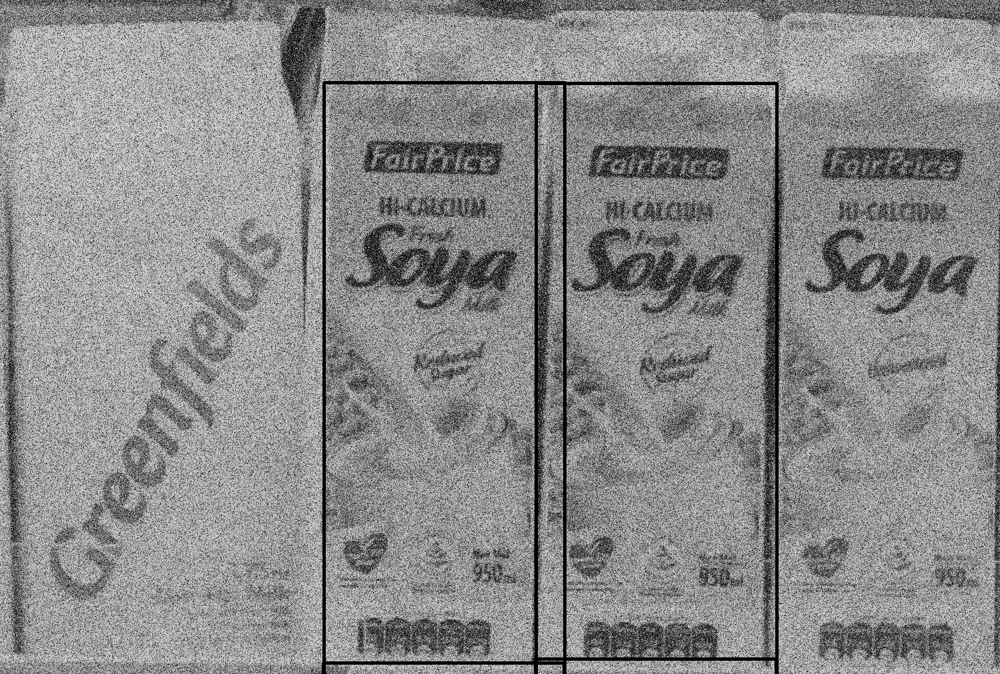

In [51]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

instance_image = cv2.imread('dataset/models/ref23.png', cv2.IMREAD_GRAYSCALE)
scene_image = cv2.imread('dataset/scenes/scene8_filtered.png', cv2.IMREAD_GRAYSCALE)

sift = cv2.SIFT_create()

keypoints_query, descriptors_query = sift.detectAndCompute(instance_image, None)
keypoints_train, descriptors_train = sift.detectAndCompute(scene_image, None)

flann = cv2.FlannBasedMatcher()
matches = flann.knnMatch(descriptors_query, descriptors_train, k=2)

good_matches = []
for m, n in matches:

    if m.distance < 0.8 * n.distance:
        good_matches.append(m)

matched_instance_points = np.float32([keypoints_query[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
matched_scene_points = np.float32([keypoints_train[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

ransac_thresh = 10
M, mask = cv2.findHomography(matched_instance_points, matched_scene_points, cv2.RANSAC, ransac_thresh)

matchesMask = mask.ravel().tolist()

scene_image_with_boxes = scene_image.copy()

h, w = instance_image.shape[:2]
instance_corners = np.float32([[0, 0], [0, h- 1], [w - 1, h- 1], [w- 1, 0]]).reshape(-1, 1, 2)
transformed_corners = cv2.perspectiveTransform(instance_corners, M)
instances_count = len(transformed_corners)
#print(f"Product 0 - {instances_count} instance found:")
for idx, corner in enumerate(transformed_corners, start=1):
    x, y = corner.ravel()
    cv2.rectangle(scene_image_with_boxes, (int(x), int(y)), (int(x) + w, int(y) + h), (0, 255, 0), 3)
    #print(f"  Instance {idx} {{position: ({int(x) + w//2}, {int(y) + h//2}), width: {w}px, height: {h}px}}")

cv2_imshow(scene_image_with_boxes)


Notes on this:
- it is sometimes overdetected, like shown on the result image, there are additional bounding boxes. I tried on varying the parameter like ransac threshold and n.distance but not yet succeded.

### ***USING SIFT - FLANN - DBSCAN ***

(https://medium.com/analytics-vidhya/copy-move-forgery-detection-using-sift-and-dbscan-clustering-4a179c36293e)

Number of keypoints in query image: 298
Number of keypoints in train image: 8914
Number of good matches: 47
Matched instance points shape: (47, 2)
Matched scene points shape: (47, 2)
Unique labels (clusters): {0, 1, 2}
Cluster 0:
  Number of points in cluster: 20
  Height of bounding box: 608.0
  Width of bounding box: 220.0
  Center position of bounding box: (130.0, 365.0)
Cluster 1:
  Number of points in cluster: 23
  Height of bounding box: 589.0
  Width of bounding box: 233.0
  Center position of bounding box: (405.0, 389.0)
Cluster 2:
  Number of points in cluster: 3
  Not enough points in cluster: 3


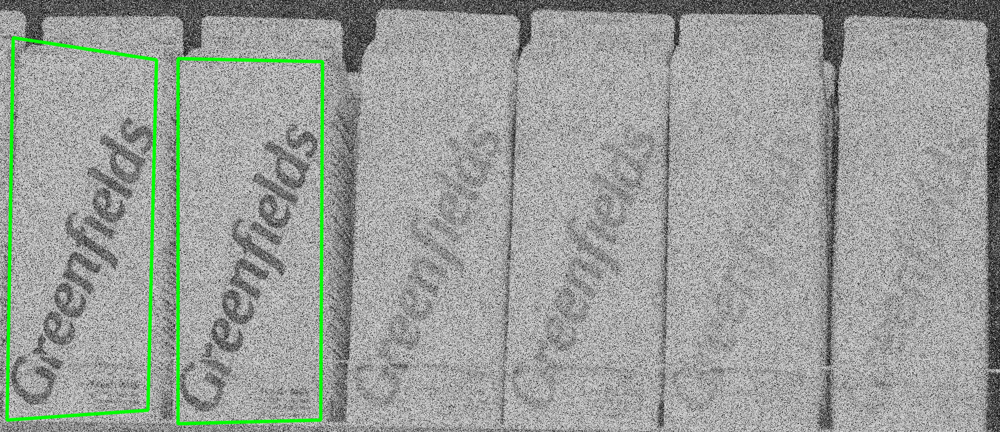

In [50]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.cluster import DBSCAN

def object_detect(img_query, img_train, min_match_count=10):
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors
    keypoints_query, descriptors_query = sift.detectAndCompute(img_query, None)
    keypoints_train, descriptors_train = sift.detectAndCompute(img_train, None)

    print(f"Number of keypoints in query image: {len(keypoints_query)}")
    print(f"Number of keypoints in train image: {len(keypoints_train)}")

    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)


    matches = flann.knnMatch(descriptors_query, descriptors_train, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

    print(f"Number of good matches: {len(good_matches)}")

    if len(good_matches) > min_match_count:
        matched_instance_points = np.float32([keypoints_query[m.queryIdx].pt for m in good_matches])
        matched_scene_points = np.float32([keypoints_train[m.trainIdx].pt for m in good_matches])

        print(f"Matched instance points shape: {matched_instance_points.shape}")
        print(f"Matched scene points shape: {matched_scene_points.shape}")

        clustering = DBSCAN(eps=100, min_samples=2).fit(matched_scene_points)
        labels = clustering.labels_

        unique_labels = set(labels)
        unique_labels.discard(-1)

        print(f"Unique labels (clusters): {unique_labels}")

        scene_image_with_boxes = cv2.cvtColor(img_train, cv2.COLOR_GRAY2BGR)

        for label in unique_labels:
            label_mask = (labels == label)
            cluster_instance_points = matched_instance_points[label_mask].reshape(-1, 1, 2)
            cluster_scene_points = matched_scene_points[label_mask].reshape(-1, 1, 2)

            print(f"Cluster {label}:")
            print(f"  Number of points in cluster: {len(cluster_instance_points)}")

            if len(cluster_instance_points) > min_match_count:
                M, mask = cv2.findHomography(cluster_instance_points, cluster_scene_points, cv2.RANSAC, 5.0)

                if M is not None:
                    h, w = img_query.shape[:2]
                    instance_corners = np.float32([[0, 0], [0, h- 1], [w - 1, h - 1], [w- 1, 0]]).reshape(-1, 1, 2)
                    transformed_corners = cv2.perspectiveTransform(instance_corners, M)

                    cv2.polylines(scene_image_with_boxes, [np.int32(transformed_corners)], True, (0, 255, 0), 3, cv2.LINE_AA)

                    bounding_box_height = abs(transformed_corners[0][0][1] - transformed_corners[2][0][1])
                    bounding_box_width = abs(transformed_corners[0][0][0] - transformed_corners[2][0][0])
                    center_position = ((transformed_corners[0][0][0] + transformed_corners[2][0][0]) // 2,
                                       (transformed_corners[0][0][1] + transformed_corners[2][0][1]) // 2)

                    print(f'  Height of bounding box: {round(bounding_box_height, 0)}')
                    print(f'  Width of bounding box: {round(bounding_box_width, 0)}')
                    print(f'  Center position of bounding box: {center_position}')
                else:
                    print("  Homography could not be computed")
            else:
                print(f"  Not enough points in cluster: {len(cluster_instance_points)}")

        return scene_image_with_boxes

    else:
        print(f"Not enough matches are found - {len(good_matches)}/{min_match_count}")
        return img_train

query = cv2.imread('dataset/models/ref26.png', cv2.IMREAD_GRAYSCALE)
scene = cv2.imread('dataset/scenes/scene12_filtered.png', cv2.IMREAD_GRAYSCALE)
result = object_detect(query, scene, min_match_count=10)
cv2_imshow(result)


Notes on this:
- it does not work well for all scene images, yet

### **USING TEMPLATE MATCHING**

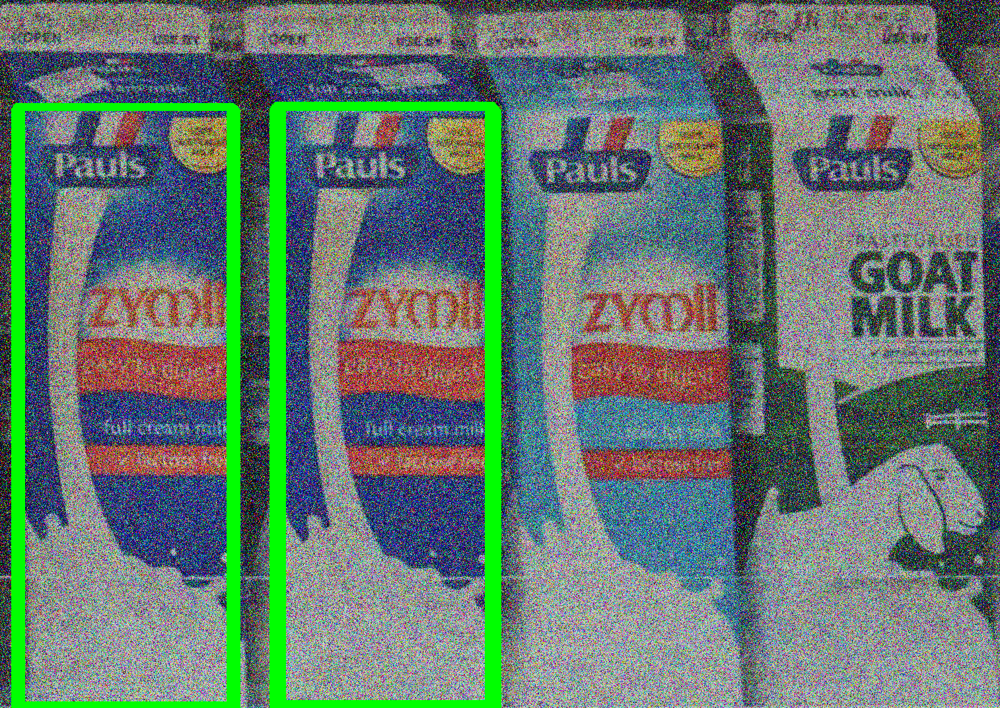

In [49]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def object_detect(img_query, img_train, threshold=0.5):
    query = cv2.cvtColor(img_query, cv2.COLOR_BGR2GRAY)
    train = cv2.cvtColor(img_train, cv2.COLOR_BGR2GRAY)

    result = cv2.matchTemplate(train, query, cv2.TM_CCOEFF_NORMED)
    loc = np.where(result >= threshold)
    scene_image_with_boxes = img_train.copy()
    h, w = query.shape[:2]
    for pt in zip(*loc[::-1]):
        cv2.rectangle(scene_image_with_boxes, pt,
         (pt[0] + w, pt[1] + h),
          (0, 255, 0), 2)

    return scene_image_with_boxes

img_query = cv2.imread('dataset/models/ref15.png')
img_train = cv2.imread('dataset/scenes/scene6_filtered.png')
result = object_detect(img_query, img_train)
cv2_imshow(result)

Some notes on template matching:

Some scene images require different threshold setting:
- for scene6, the threshold 0.5 is good enough to detect instances
- for scene8, the threshold 0.125 is good to detect instances


